In [1]:
import os 
import numpy as np
import pickle
import tensorflow as tf
import keras
import cv2
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import resnet50
from tqdm import tqdm_notebook as tqdm

## Feature extraction with ResNet50

In [2]:
model = resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path, target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = resnet50.preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    print(features.shape)
    flattened_features = features.flatten()
    normalized_features = flattened_features / np.linalg.norm(flattened_features)
    return normalized_features

In [3]:
features = extract_features('../data/raw/sources/89.png', model)
print(len(features))


1/1 [==============================] - 0s 430ms/step
(1, 7, 7, 2048)
100352


### Listing filenames of the images

In [9]:
def get_file_list(root_dir):
    extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']
    file_list = []
    counter = 1
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                file_list.append(os.path.join(root, filename))
                counter += 1
    return file_list

# path to the datasets
root_dir = '../data/preprocessed/sub_imgs_of_sources'
filenames = sorted(get_file_list(root_dir))
len(filenames)

1565

### Feature extraction from images

In [9]:
feature_list = []
for i in tqdm(range(len(filenames))):
    feature_list.append(extract_features(filenames[i], model))

pickle.dump(feature_list, open('../data/preprocessed/features/features-imagetwin-resnet.pickle', 'wb'))
pickle.dump(filenames, open('../data/preprocessed/features/filenames-imagetwin.pickle','wb'))

/var/folders/6q/lfqcc49d7z1dd68wmncp6ccc0000gn/T/ipykernel_75593/3504176976.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(len(filenames))):


  0%|          | 0/1565 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/s

1/1 [==============================] - 0s 59ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 60ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 57ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/s

1/1 [==============================] - 0s 59ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 61ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/s

1/1 [==============================] - 0s 57ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 58ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 57ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/s

1/1 [==============================] - 0s 63ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 58ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 58ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 58ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 57ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/s

1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/s

1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/s

In [11]:
filenames = pickle.load(open('../data/preprocessed/features/filenames-imagetwin.pickle', 'rb'))
feature_list = pickle.load(open('../data/preprocessed/features/features-imagetwin-resnet.pickle', 'rb'))

## Finding nearest neighbours in embedded space 

In [12]:
neighbors = NearestNeighbors(n_neighbors=5, 
                             algorithm='brute',
                             metric='euclidean'
                            ).fit(feature_list)

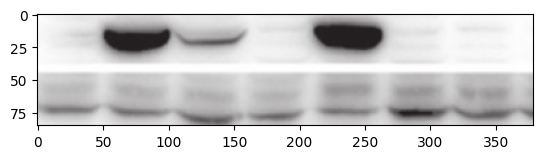

In [14]:
test_img_idx = 23
plt.imshow(mpimg.imread(filenames[test_img_idx]))

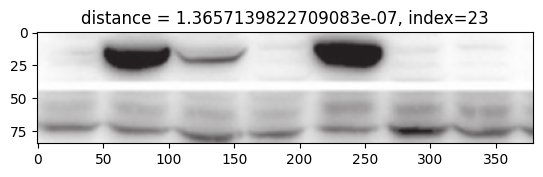

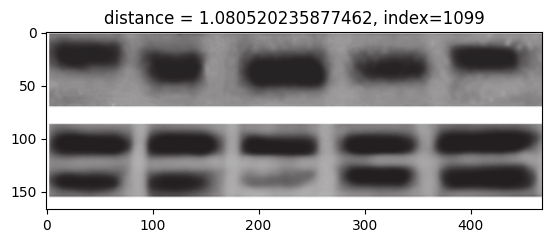

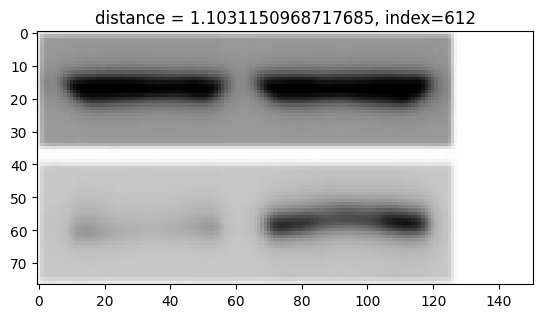

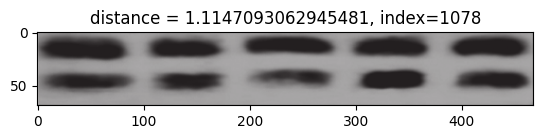

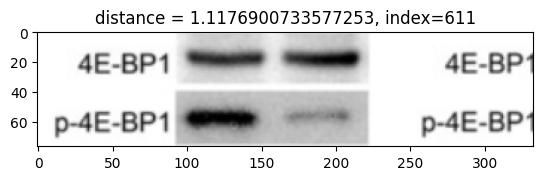

In [15]:
distances, indices = neighbors.kneighbors([feature_list[test_img_idx]])
#distances, indices = np.flip(distances), np.flip(indices)
for d, idx in zip(distances[0], indices[0]):
    plt.figure()
    plt.title('distance = ' + str(d)+ ', index='+str(idx))
    plt.imshow(mpimg.imread(filenames[idx]))

### Extracting features from query images

In [17]:
queries_filenames = sorted(get_file_list('../data/raw/queries'))
len(queries_filenames)
### Feature extraction from queries
query_feature_list = []
for i in tqdm(range(len(queries_filenames))):
    query_feature_list.append(extract_features(queries_filenames[i], model))

/var/folders/6q/lfqcc49d7z1dd68wmncp6ccc0000gn/T/ipykernel_65567/917691175.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(len(queries_filenames))):


  0%|          | 0/18 [00:00<?, ?it/s]

1/1 [==============================] - 0s 109ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 56ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 55ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 52ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 54ms/step
(1, 7, 7, 2048)
1/1 [==============================] - 0s 53ms/

## Checking whether a query image is similar to images in source

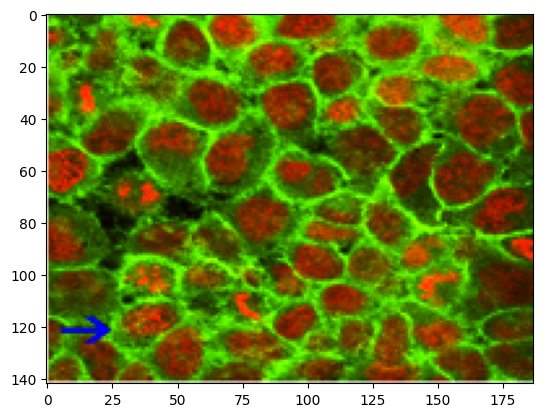

In [18]:
test_img_idx = 0

plt.imshow(mpimg.imread(queries_filenames[test_img_idx]))

/var/folders/6q/lfqcc49d7z1dd68wmncp6ccc0000gn/T/ipykernel_65567/258834467.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


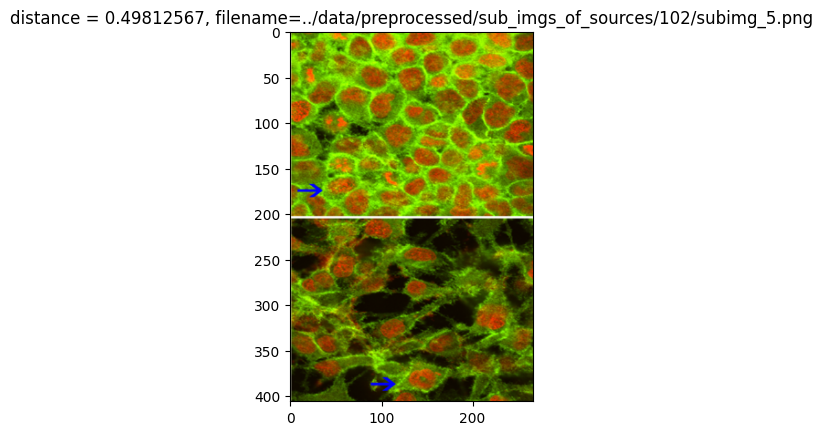

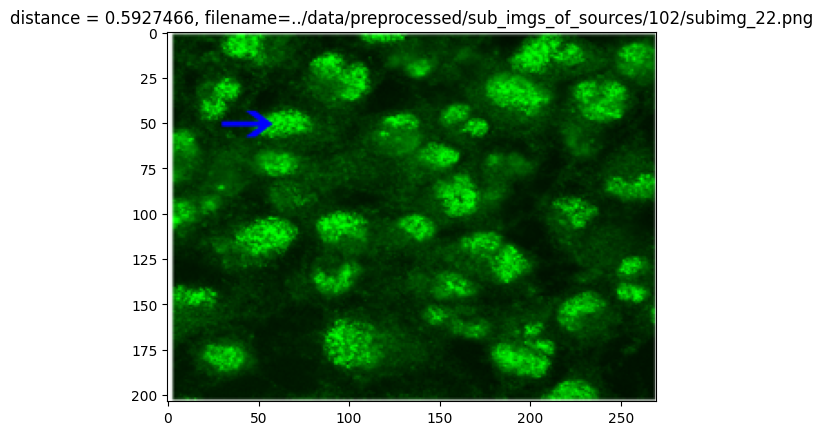

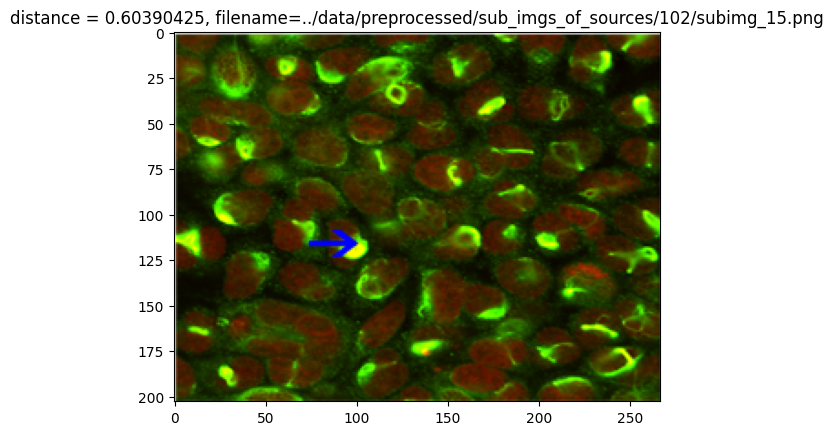

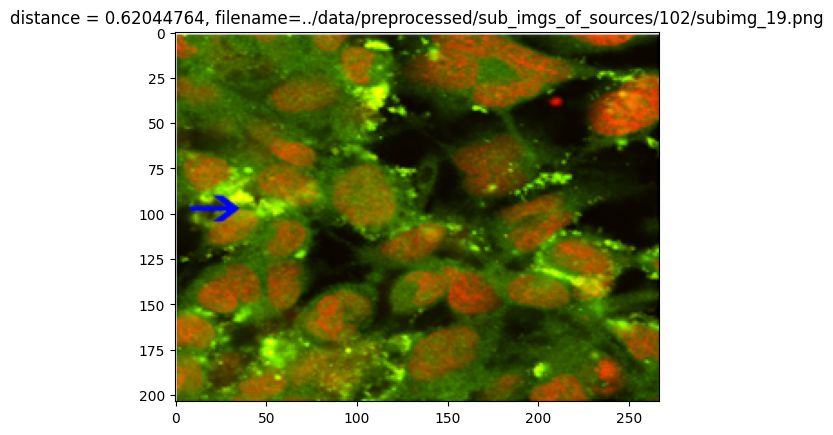

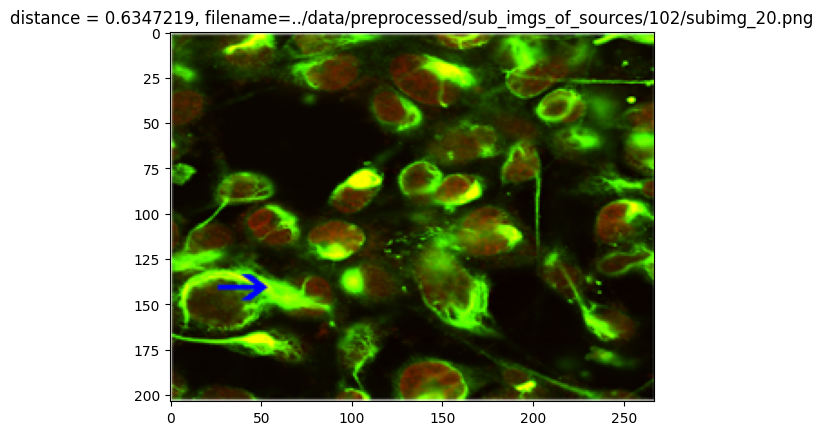

...

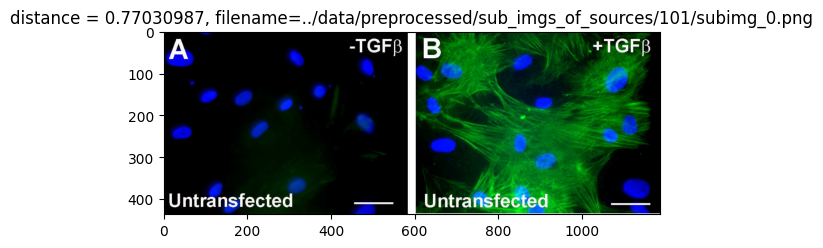

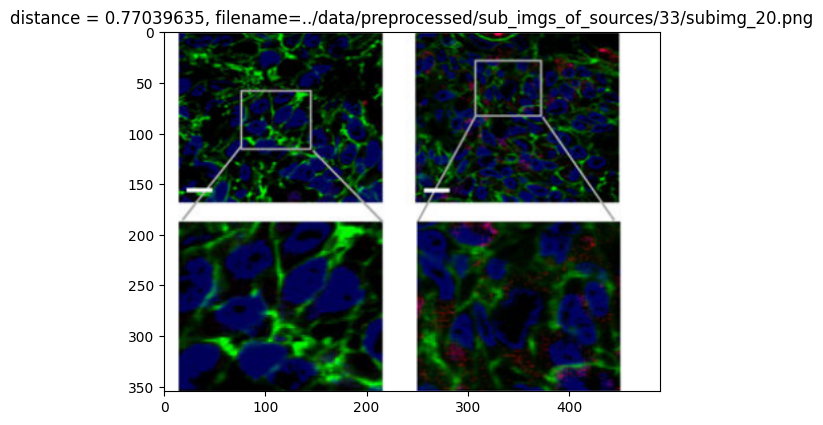

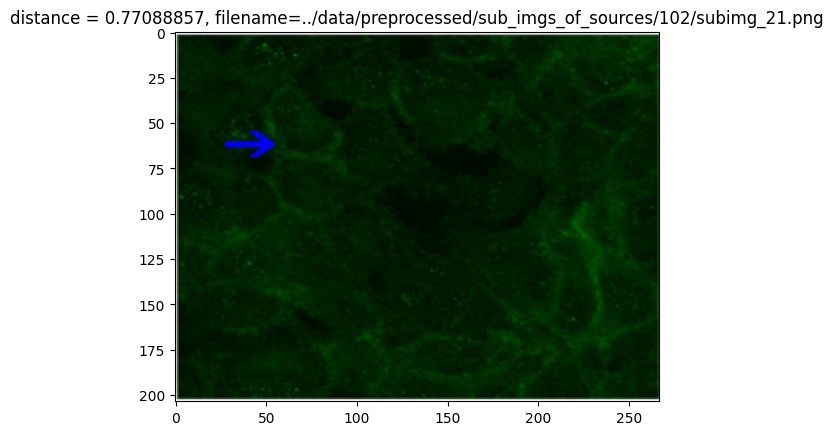

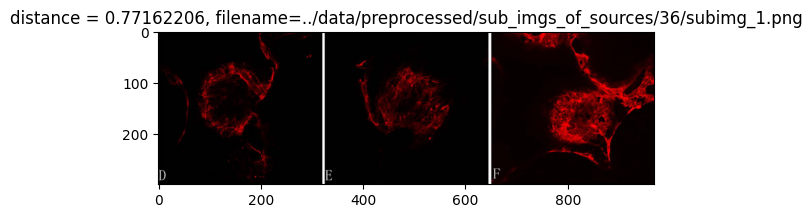

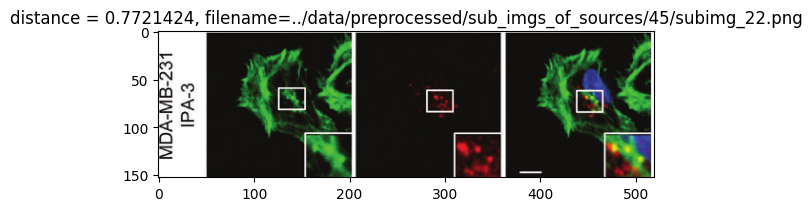

In [19]:
neighbors = NearestNeighbors(n_neighbors=50, 
                             algorithm='brute',
                             metric='cosine'
                            ).fit(feature_list)
distances, indices = neighbors.kneighbors([query_feature_list[test_img_idx]])
for d, idx in zip(distances[0], indices[0]):
    plt.figure()
    plt.title('distance = ' + str(d)+ ', filename='+str(filenames[idx]))
    plt.imshow(mpimg.imread(filenames[idx]))